# This Study Material is prepared and written by me, Subhojit Ghimire.

Use of this material for educational purposes is free.

### Section 1

Topics Covered:
1. ray init
2. ray remote
3. ray task
4. ray actor
5. ray get

Use the following links for self-study and query-resolution, after going through this document first:
```
    https://github.com/anyscale/academy/tree/main/ray-crash-course/
    https://docs.ray.io/en/latest/ray-core/tips-for-first-time.html/
    https://rise.cs.berkeley.edu/blog/ray-tips-for-first-time-users/
```

# Ray Init

### Method 1: Simple Init

In [2]:
import ray
ray.init(ignore_reinit_error=True)

2025-08-08 15:53:14,330	INFO worker.py:1918 -- Started a local Ray instance. View the dashboard at 127.0.0.1:8265 


Python version:,3.10.0
Ray version:,2.48.0
Dashboard:,http://127.0.0.1:8265


### Method 2: Recommended. First shutdown any running ray instances, and start a fresh new ray initialisation.

In [1]:
import ray
if ray.is_initialized():
    ray.shutdown()
ray.init()

2025-08-08 16:26:11,799	INFO worker.py:1918 -- Started a local Ray instance. View the dashboard at 127.0.0.1:8265 


Python version:,3.10.0
Ray version:,2.48.0
Dashboard:,http://127.0.0.1:8265


In this case, the path to Ray Dashboard (to be discussed further in Section 2) will be localhost. Press the link printed (in this case, http://127.0.0.1:8265) to open the Ray Dashboard. Take a look around.
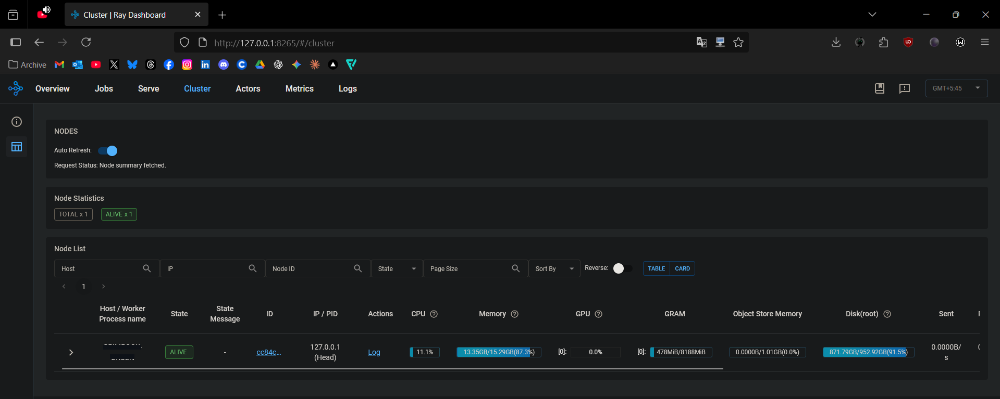

Import Ray and Ray Init should always be present in the code at the very start, if you are using any ray processes in the code. I will not be showing ray.init() in all the code examples to follow. It is assumed that it is understood that ray.init() is always and already invoked once at the very top of the code, where libraries are imported.

# Ray Remote Decorator and Caller

First, let’s take a look at how a normal Function looks like in Python and how it is invoked.

In [5]:
def someFunction(someParameter):
    incrementedParameter = someParameter + 2
    return incrementedParameter

someVariable = someFunction(5)
print(someVariable)

7


Ray Remote

In [7]:
@ray.remote
def someFunction():
    # some statements
    return

@ray.remote used over any function or class is called decorator that tells the code that specific function or class will behave as a ray function or ray class instead of a normal python function or a normal python class.

Let's convert the normal python function to a ray function using this decorator

In [8]:
@ray.remote
def someFunction(someParameter):
    incrementedParameter = someParameter + 2
    return incrementedParameter

someVariable = someFunction.remote(5)
print(ray.get(someVariable))

7


When calling that function, instead of someFunction(), we put a remote caller at the end to invoke ray. someFunction.remote()

Ray remote is used in two different forms, one as decorator @ray.remote, and the other as invoker, someFunction.remote().


Now let’s see this same action of ray remote in Class.

In [9]:
@ray.remote
class SomeClass:
    def __init__(self):
        pass
    def someMethod(self, someParameter):
        incrementedParameter = someParameter + 2
        return incrementedParameter

someInstance = SomeClass.remote()
someVariable = someInstance.someMethod.remote(5)
print(ray.get(someVariable))

7


Notice how decorator is used before defining Class. Notice how Class Functions (aka, Methods) don’t have @ray.remote decorator. Notice how .remote() is used to make Class Instance, as well as to call Class Method, even though the Method didn’t have a decorator.

# Ray Task and Ray Actor

### Ray Task
Python Function when used with @ray.remote decorator is called Ray Task.

Let’s take a Prime Number Checker Code for example. We will check whether the numbers 1 through 19 are Prime or not using Python Function with and without ray. For each number, we will also be pausing the process for that number of seconds. This way, we can realise the total time taken in two cases- without ray, and with ray.

When running without ray, it is basically running sequentially, so the total time taken will add up as such 1+2+3+… 18+19 seconds, totalling to 190 seconds (~3 minutes). When running with ray, it is running parallelly, so the total time taken should not exceed the maximum time that any number will take, in this case, it accounts to 19 seconds +- 2 seconds.

First, let’s look at Prime Function without Ray, i.e. sequentially:

In [15]:
import time

# Prime Check Function WITHOUT Using Ray
def is_prime(n):
    time.sleep(n) # To simulate performance-hungry task
    if n < 2:
        return False
    for i in range(2, int(n ** 0.5) + 1):
        if n % i == 0:
            return False
    return True

# Find Primes function
def find_primes_sequential(numbers):
    start = time.time()
    results = {}
    for n in numbers:
        results[n] = is_prime(n)
    end = time.time()
    print(f"Sequentially processing task {(end - start)/60:.2f} minutes")
    return results

if __name__ == "__main__":
    numbers = list(range(1, 20))
    print("Running sequential version:")
    seq_primes = find_primes_sequential(numbers)
    print("Sequential Processed Results:", seq_primes)

Running sequential version:
Sequentially processing task 3.17 minutes
Sequential Processed Results: {1: False, 2: True, 3: True, 4: False, 5: True, 6: False, 7: True, 8: False, 9: False, 10: False, 11: True, 12: False, 13: True, 14: False, 15: False, 16: False, 17: True, 18: False, 19: True}


Now, let’s look at Prime Function with Ray, i.e., parallelly:

In [ ]:
# Prime Check Task USING Ray
@ray.remote
def is_prime(n):
    time.sleep(n) # To simulate performance-hungry task
    if n < 2:
        return False
    for i in range(2, int(n ** 0.5) + 1):
        if n % i == 0:
            return False
    return True

# Find Primes Function
def find_primes_parallel(numbers):
    start = time.time()
    futures = {}
    for n in numbers:
        futures[n] = is_prime.remote(n)
    results = {}
    for n in numbers:
        results[n] = ray.get(futures[n])
    end = time.time()
    print(f"Parallel processing took {end - start:.2f} seconds")
    return results

if __name__ == "__main__":
    numbers = list(range(1, 20))
    print("\nRunning parallel version with Ray:")
    par_primes = find_primes_parallel(numbers)
    print("Parallelly Processed Results:", par_primes)


Running parallel version with Ray:
Parallel processing took 22.02 seconds
Parallelly Processed Results: {1: False, 2: True, 3: True, 4: False, 5: True, 6: False, 7: True, 8: False, 9: False, 10: False, 11: True, 12: False, 13: True, 14: False, 15: False, 16: False, 17: True, 18: False, 19: True}


As can be seen from the output, the time taken is 22 seconds when run with ray, while the time taken for the same task was 3 minutes in normal execution.

Notice how I have written Function and Task differently in comments. These are just nomenclature for easy understanding. Function with ray is called Task. Class with ray is called Actor (as we will see next). Ray Task and Ray Actor are just some ray nomenclature, meaning the same thing as Function and Class in normal programming.

### Ray Actor
Python Class when used with @ray.remote decorator is called Ray Actor. Actor/Class methods don’t require @ray.remote decorator.

We will use the same Prime Function that we used above and rewrite it as Prime Class.

First, let’s look at Prime Class without Ray, i.e. sequentially:

In [4]:
# Prime Check Class WITHOUT Using Ray
class PrimeCheck:
    def __init__(self):
        self.result = None
    
    # Prime Check Method Within Prime Check Class
    def is_prime(self, n):
        time.sleep(n) # To simulate performance-hungry task
        if n < 2:
            self.result = False
            return
        for i in range(2, int(n ** 0.5) + 1):
            if n % i == 0:
                self.result == False
                return
        self.result = True
        return
    def get_result(self):
        return self.result

# Find Primes Function
def find_prime_sequential(numbers):
    start = time.time()
    classInstances = {}
    for n in numbers:
        classInstances[n] = PrimeCheck()
        classInstances[n].is_prime(n)
    results = {}
    for n in numbers:
        results[n] = classInstances[n].get_result()
        del classInstances[n]
    end = time.time()
    print(f"Sequential processing took {(end - start)/60:.2f} minutes")
    return results

if __name__ == "__main__":
    numbers = list(range(1, 20))
    print("Running sequential version:")
    seq_primes = find_prime_sequential(numbers)
    print("Sequential Processed Results:", seq_primes)

Running sequential version:
Sequential processing took 3.17 minutes
Sequential Processed Results: {1: False, 2: True, 3: True, 4: None, 5: True, 6: None, 7: True, 8: None, 9: None, 10: None, 11: True, 12: None, 13: True, 14: None, 15: None, 16: None, 17: True, 18: None, 19: True}


We could have used a single classInstance = PrimeCheck() instead of making a new instance for each number. This is viable in normal python execution, and makes no difference, instead is a better practice of writing code. However, in case of Ray, this will not work. I will showcase it later (topic: How NOT to write Ray Actor).

For now, just to show 1:1 transposition of Normal Class to Ray Actor, I am writing it this way for simplicity and easy understanding.

Now, let’s look at Prime Class with Ray, i.e., parallelly:

In [5]:
# Prime Check Actor USING Ray
@ray.remote
class PrimeCheck:
    def __init__(self):
        self.result = None
    
    # Prime Check Method within Prime Check Actor
    def is_prime(self, n):
        time.sleep(n) # To simulate performance-hungry task
        if n < 2:
            self.result = False
            return
        for i in range(2, int(n ** 0.5) + 1):
            if n % i == 0:
                self.result == False
                return
        self.result = True
        return
    def get_result(self):
        return self.result

# Find Primes Function
def find_prime_parallel(numbers):
    start = time.time()
    actorInstances = {}
    for n in numbers:
        actorInstances[n] = PrimeCheck.remote()
        actorInstances[n].is_prime.remote(n)
    futures = {}
    for n in numbers:
        futures[n] = actorInstances[n].get_result.remote()
    results = {}
    for n in numbers:
        results[n] = ray.get(futures[n])
        ray.kill(actorInstances[n])
    end = time.time()
    print(f"Parallel processing took {(end - start):.2f} seconds")
    return results

if __name__ == "__main__":
    numbers = list(range(1, 20))
    print("Running parallel version with Ray:")
    par_primes = find_prime_parallel(numbers)
    print("Parallelly Processed Results:", par_primes)

Running parallel version with Ray:
Parallel processing took 25.49 seconds
Parallelly Processed Results: {1: False, 2: True, 3: True, 4: None, 5: True, 6: None, 7: True, 8: None, 9: None, 10: None, 11: True, 12: None, 13: True, 14: None, 15: None, 16: None, 17: True, 18: None, 19: True}


Notice how I have written Class and Actor differently in comments. Notice how Methods don’t use ray remote decorator, still when invoking methods, we use .remote() caller.

Notice how we made a new actor instances for each number. This is essential in case of ray, in order to run it parallelly. Let’s take a look at what happens when we use a single actor instance for all ray actor methods (topic: How NOT to write Ray Actor).

Notice how del instance is written as ray.kill(instance). As good coding practice states, any class instance, if not to be used any further, should be destroyed, otherwise the instance will stay alive and consume memory/space, unlike tasks, which are stateless.

### How NOT to write Ray Actor
Let’s first see the preferred/better way of writing the same Class in normal coding.


In [7]:
# Prime Check Class WITHOUT Using Ray
class PrimeCheck:
    def __init__(self, results):
        self.results = results
    
    # Prime Check Method within Prime Check Class
    def is_prime(self, n):
        time.sleep(n) # To simulate performance-hungry task
        if n < 2:
            self.results[n] = False
            return
        for i in range(2, int(n ** 0.5) + 1):
            if n % i == 0:
                self.results[n] = False
                return
        self.results[n] = True
        return
    
    def get_results(self):
        return self.results

# Find Primes Function
def find_primes_sequential(numbers):
    start = time.time()
    results = {}
    classInstance = PrimeCheck(results)
    for n in numbers:
        classInstance.is_prime(n)
    results = classInstance.is_prime(n)
    del classInstance
    end = time.time()
    print(f"Sequential processing took {(end - start)/60:.2f} minutes")
    return results

if __name__ == "__main__":
    numbers = list(range(1, 20))
    print("Running sequential version:")
    seq_primes = find_primes_sequential(numbers)
    print("Sequential Processed Results:", seq_primes)

Running sequential version:
Sequential processing took 3.49 minutes
Sequential Processed Results: None


Notice how I have used only one class Instance instead of making multiple instances. In case of running a code sequentially, this is the better practice, using as less variables as possible, using as little memory objects as possible.

However, when used this technique with ray, even ray will treat it as sequential, because we are parallelising the class, not the method. And if we make a single class Instance, only one parallel process is created, and that is for the class itself, not for the methods or functions or other processes taking place inside of the class.

Let’s take a look at what I mean. The above “preferred” Class code transposed 1:1 to Ray Actor.

In [8]:
# Prime Check Actor USING Ray
@ray.remote
class PrimeCheck:
    def __init__(self, results):
        self.results = results
    
    # Prime Check Method within Prime Check Actor
    def is_prime(self, n):
        time.sleep(n) # To simulate performance-hungry task
        if n < 2:
            self.results[n] = False
            return
        for i in range(2, int(n ** 0.5) + 1):
            if n % i == 0:
                self.results[n] = False
                return
        self.results[n] = True
        return
    
    def get_results(self):
        return self.results

# Find Primes Function
def find_primes_parallel(numbers):
    start = time.time()
    results = {}
    actorInstance = PrimeCheck.remote(results)
    for n in numbers:
        actorInstance.is_prime.remote(n)
    futures = actorInstance.get_results.remote()
    results = ray.get(futures)
    ray.kill(actorInstance)
    end = time.time()
    print(f"Parallel processing took {(end - start)/60:.2f} minutes")
    return results

if __name__ == "__main__":
    numbers = list(range(1, 20))
    print("Running parallel version with Ray:")
    par_primes = find_primes_parallel(numbers)
    print("Parallelly Processed Results:", par_primes)

Running parallel version with Ray:
Parallel processing took 3.23 minutes
Parallelly Processed Results: {1: False, 2: True, 3: True, 4: False, 5: True, 6: False, 7: True, 8: False, 9: False, 10: False, 11: True, 12: False, 13: True, 14: False, 15: False, 16: False, 17: True, 18: False, 19: True}


Notice the time taken. It is >3 minutes, clearly inferring that the process ran sequentially, despite using ray.remote() and despite the code looking correct and logical. So, be careful if the Ray code you have written is indeed parallelising or not.

# Ray Get

Ray Remote returns values in as Object Addresses. To read this object address in value format, we
use ray.get().

In [12]:
@ray.remote
class SomeClass:
    def __init__(self):
        pass
    def someMethod(self, someParameter):
        incrementedParameter = someParameter + 2
        return incrementedParameter

someInstance = SomeClass.remote()
future = someInstance.someMethod.remote(5)

print(f"Future is Object Reference:", future)
result = ray.get(future)
print(f"Human Readable Output:", result)

Future is Object Reference: ObjectRef(8c115ad83d29434cfceb0515d700ec8cf3f564750100000001000000)
Human Readable Output: 7


In [13]:
@ray.remote
def someFunction():
    return [1, 2, 3]

future = someFunction.remote()

print(f"Future is Object Reference:", future)
result = ray.get(future)
print(f"Human Readable Output:", result)

Future is Object Reference: ObjectRef(ddbc5f4ddd8bc822ffffffffffffffffffffffff0100000001000000)
Human Readable Output: [1, 2, 3]


In [14]:
@ray.remote
def someFunction(n):
    return n*10

futures = [someFunction.remote(n) for n in range(5)]

print(f"Future is Object Reference:", futures)
result = ray.get(futures)
print(f"Human Readable Output:", result)

Future is Object Reference: [ObjectRef(c49845173a8098c6ffffffffffffffffffffffff0100000001000000), ObjectRef(fc8c7156f41551baffffffffffffffffffffffff0100000001000000), ObjectRef(a663af0e78d41c9bffffffffffffffffffffffff0100000001000000), ObjectRef(58623fc2e4471617ffffffffffffffffffffffff0100000001000000), ObjectRef(1c1ddc6e66f84651ffffffffffffffffffffffff0100000001000000)]
Human Readable Output: [0, 10, 20, 30, 40]


In [16]:
@ray.remote
def someFunction(n):
    return n*10

futures = []
for idx, n in enumerate(range(5)):
    print(f"{idx+1}. Future is Object Reference:", someFunction.remote(n))
    print(f"{idx+1}. Human Readable Output:", ray.get(someFunction.remote(n)))
    print("\n")

1. Future is Object Reference: ObjectRef(7c4c96ac2929ff38ffffffffffffffffffffffff0100000001000000)
1. Human Readable Output: 0


2. Future is Object Reference: ObjectRef(108329ea52415dc5ffffffffffffffffffffffff0100000001000000)
2. Human Readable Output: 10


3. Future is Object Reference: ObjectRef(8472ab6a797f8552ffffffffffffffffffffffff0100000001000000)
3. Human Readable Output: 20


4. Future is Object Reference: ObjectRef(a59ef665ac885d5bffffffffffffffffffffffff0100000001000000)
4. Human Readable Output: 30


5. Future is Object Reference: ObjectRef(89dc65fc4da6f858ffffffffffffffffffffffff0100000001000000)
5. Human Readable Output: 40




### Section 2

Topics Covered:
1. setting up ray cluster - head node and worker node
2. ray dashboard
3. ray init - connect to the head node address
4. ray init - other parameters
5. ray stop

In production server, for running large tasks, multiple teams may use distributed processing to run their resource hungry code, for this we keep the Ray Cluster running all the time, and anybody can use the ray address to tap into the ray cluster and facilitate their code using ray resources. We are
essentially allowing a code to utilise as much resource as needed for quick and successful execution.

For instance, my personal laptop has 16 GB RAM, 8 core processor, 1TB disk storage. For serving large Machine Learning tasks, this specification is not sufficient. So, we bring multiple production servers having 500GB RAM, 256 core processors, 2TB disk storage under the same umbrella to provide a coder with a cluster totalling 2TB+ physical memory, 1000+ CPUs, 6TB+ disk allocation.

### DISCLAIMER: All the example codes that are to follow were initially executed in a multi-system setup capable of making Ray Cluster with multiple worker nodes. At the time I am compiling this Jupyter Notebook, I don't have access to that system anymore, so I am only including screenshots from the time I had access to Ray Cluster, and the codes in these screenshots were infact written and run by me, personally, in a cluster.

I will also be censoring the IPv4s of the servers in some of the screenshots, and will use 127.0.0.1, 127.0.0.2, 127.0.0.3... etc. as substitutions to denote multiple servers.

# Setting up Ray Cluster:

Jupyter Notebook has a cluster. Spark has a cluster. Elasticsearch has a cluster. torch.nn.distribute has a cluster. torch accelerate has a cluster. Similarly, Ray has a cluster. In ray cluster, we can connect multiple servers and utilise all these servers’ resources as a single ray server.

Every distributed process must have ONE head node (aka, the master node) and can have ZERO, ONE or MULTIPLE worker nodes (aka, the slave nodes).

### Setting up Head Node:
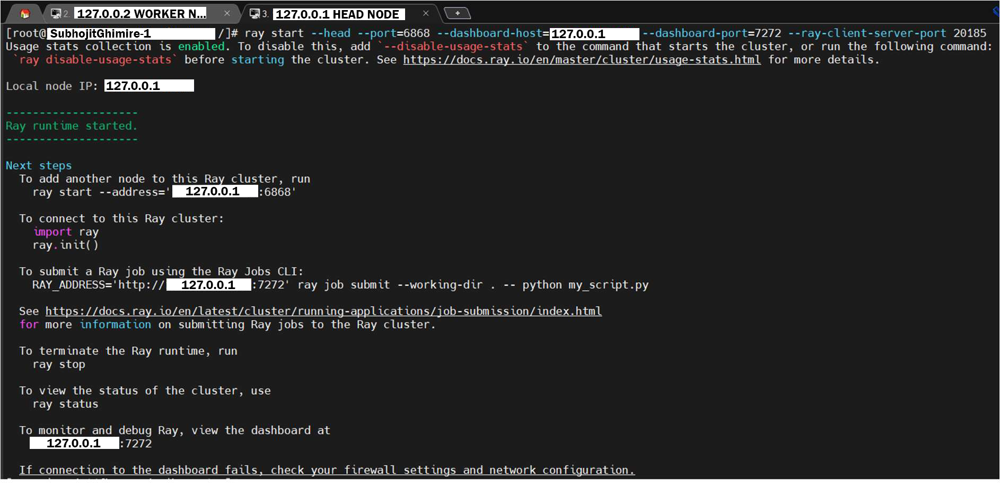

The parameter values, port, dashboard-host, dashboard-port, etc. can be changed as required.

Notice how we give dashboard-host IP address and dashboard-port number. Notice how the success message while says “To monitor and debug Ray, view the dashboard at 127.0.0.1:7272”. We can now use this address http://127.0.0.1:7272 to view the dashboard.

Notice how the success message states, “To add another node to this Ray cluster, run ray start – address=’127.0.0.1:6868’.” We will use this command to connect worker nodes.

### Setting Up Worker Nodes: (For this demo, we will use 2 worker nodes only, you may connect >1 upto any number)

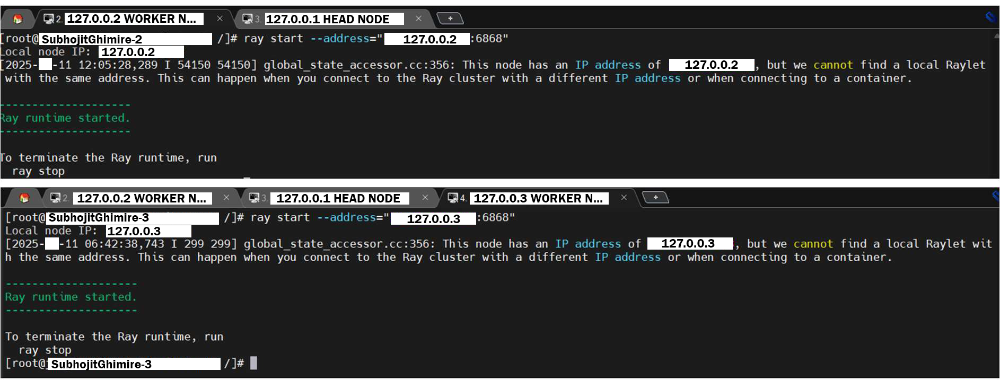

# Ray Dashboard

Open the dashboard address on your web browser to view the dashboard.

### Landing Page
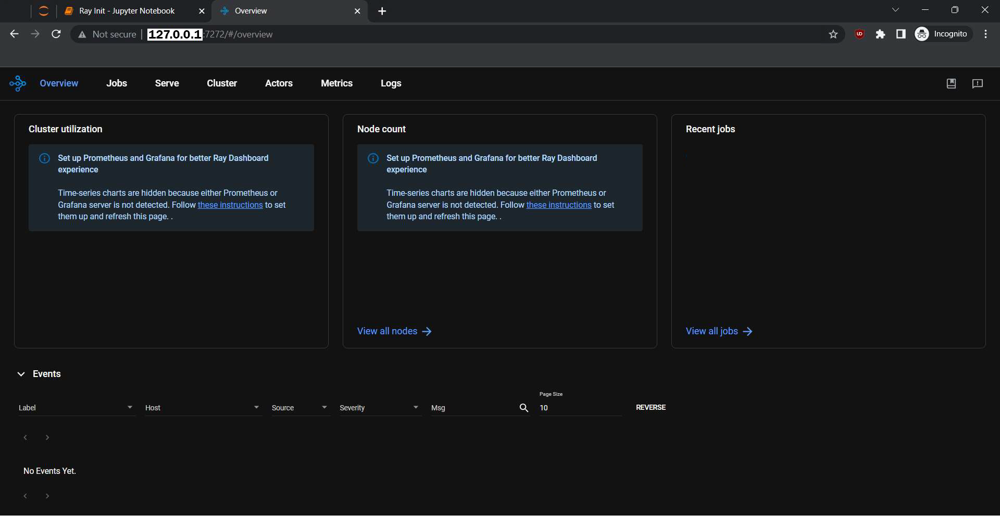

### Cluster Tab: 
This tab displays the Head Node and all the worker nodes, that are alive. We can also monitor CPU usage, RAM usage, GPU usage (if present), Object Store Memory (variables made/stored within ray) etc. Upon expanding the > arrow, we can see the processes running, if any, and the resource used by those ray.remote processes. This way, we can verify if all the nodes are
being utilised when the ray job is running, if all the CPUs are being utilised or not, etc.
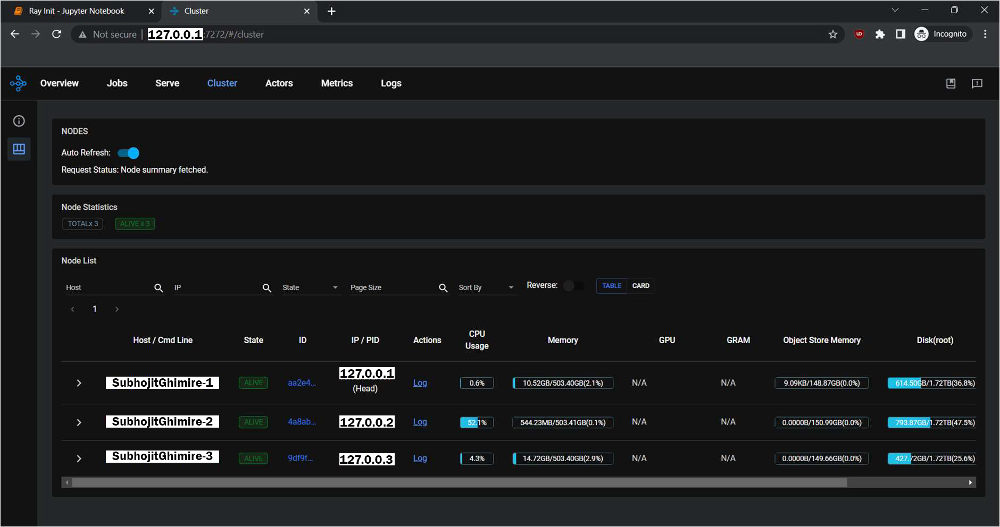

### Actors Tab: 
This tab shows all the alive Actors that were invoked from Ray Jobs, in our case, Python Code – Actor Instances. We can see which actor instance has been assigned to which node for processing. This way, we can verify if the ray actor job is indeed running parallelly, utilising all the nodes, or if it is utilising only one node, despite have multiple nodes connected and available.
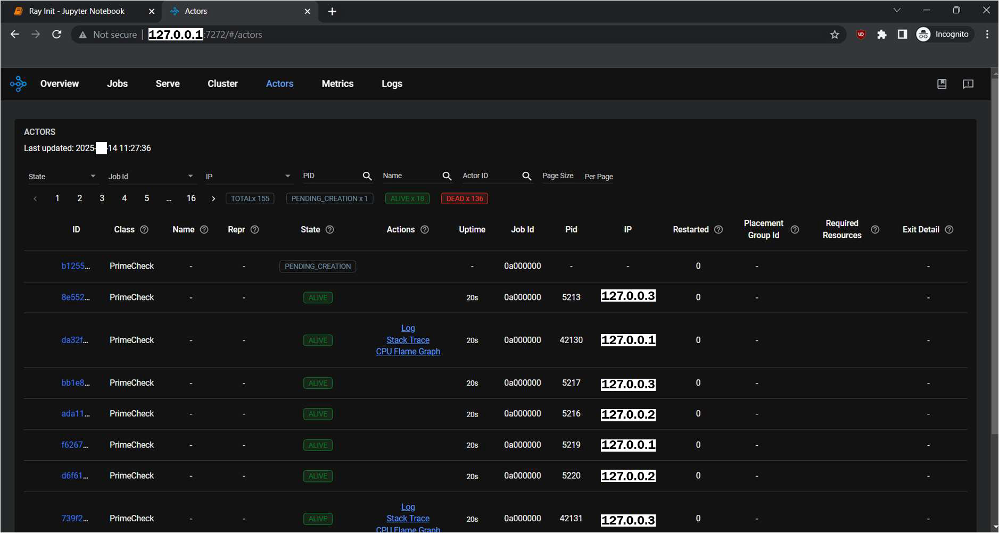

Note: Ray Task Jobs will not be visible on the Actors Tab. Ray Task Jobs can only be monitored through Cluster Tab and/or Jobs Tab. Actor Jobs, however, have dedicated Actors Tab, in top of being displayed on the Cluster Tab and/or Jobs Tab. This is because, Actors are not destroyed automatically upon completion, so we can check if any actors are still in Alive state and force destroy them later, when required, otherwise, that Actor will keep consuming Object Store Memory and can later cause Ray Out of Memory Failures.

Self-Exploration: Go through Logs Tab, as well as look at Actions Log on Jobs Tab and Cluster Tab. In case of failure, Logs are printed on Python Terminal as well, but for learning purpose, visit these Logs Tab and Actions and familiarise yourself with reading logs through UI means.


# Ray Init - Connect to dedicated Ray Cluster

Previously, we learned how to simply initialise ray using simple ray.init() command in python. This way, we are using our localhost as ray cluster, our localhost as head node, our localhost as the only node in the cluster. This is temporary initialisation of ray for running smaller tasks at hand parallelly,
and later shutting down ray after use.

Now let’s see how we can connect our ray to the Ray Cluster we made above.
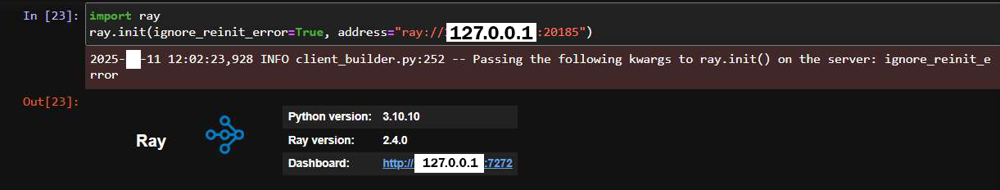

Notice, we added a parameter “address” in ray.init() and provided its value as “ray://<headNodeIP>:<ray-client-server-port>”. Both these headNodeIP and ray-client-server-port are to be the same as used in setting up the head node.

### Ray Init – Some more Parameters

In addition to address, ray.init() offers various other parameters, that can be used as required. Some of the parameters, along with example arguments, can be seen as following:
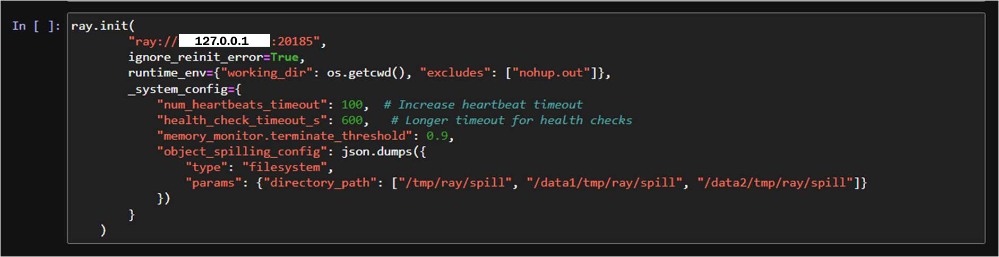

### Ray Start Options/Flags
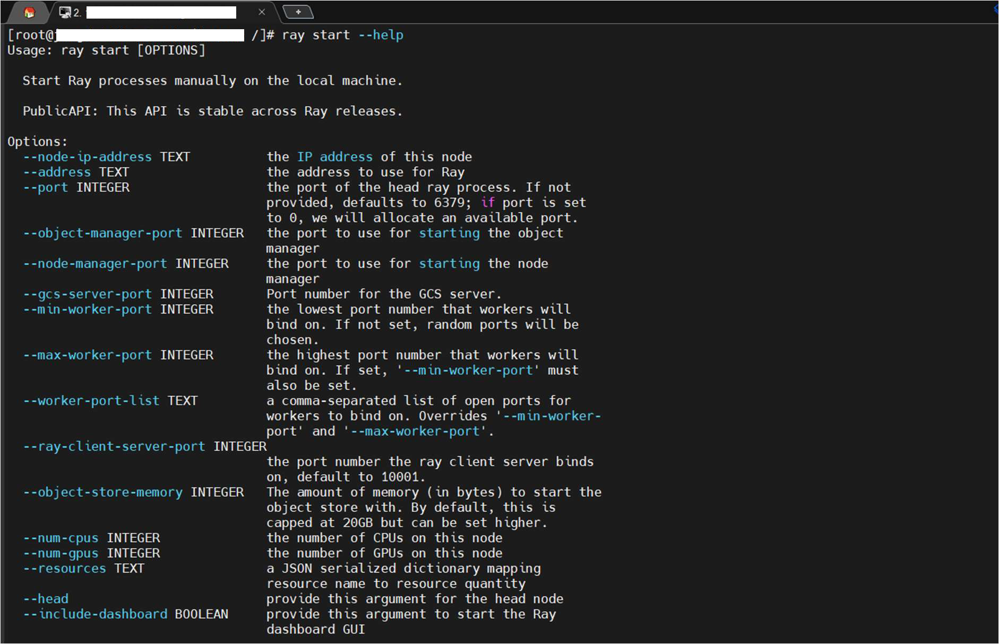
Run ray start --help to learn more about various other options that can be passed during ray cluster setup.

### What about Servers that use IPv6 addresses for login instead of IPv4?
All IPv6 servers must have a corresponding IPv4 as well. (Use ```netstat|grep inet``` and you'll see an IPv4 there, which is probably that server's IPv4). For Ray Setup and Init, strictly use IPv4, whereever ip-address is required.

# Ray Stop and shutdown

### Ray Stop Worker Node
To kill the cluster nodes (head or worker), go to the respective node's terminal and fire ```ray stop``` or ```ray stop --force``` commands.
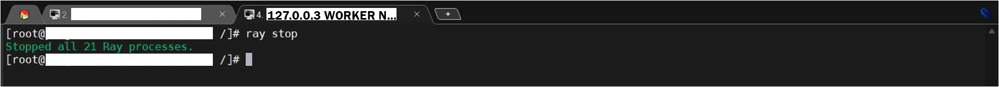
Check Dashboard, when I stop the worker node, it is displayed as Dead (or disconnected) in the Ray Dashboard. This can also be seen by running the command ray status in head node or any of the alive worker node.
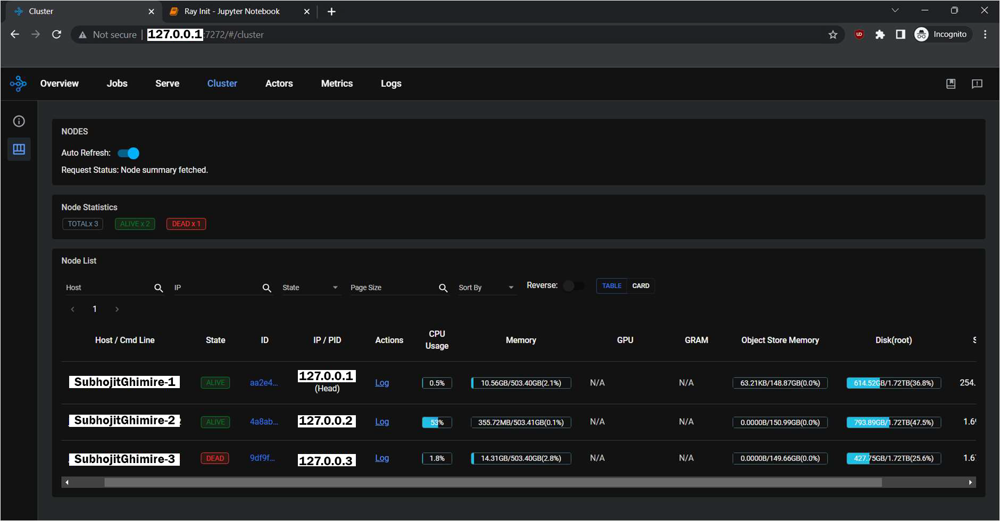

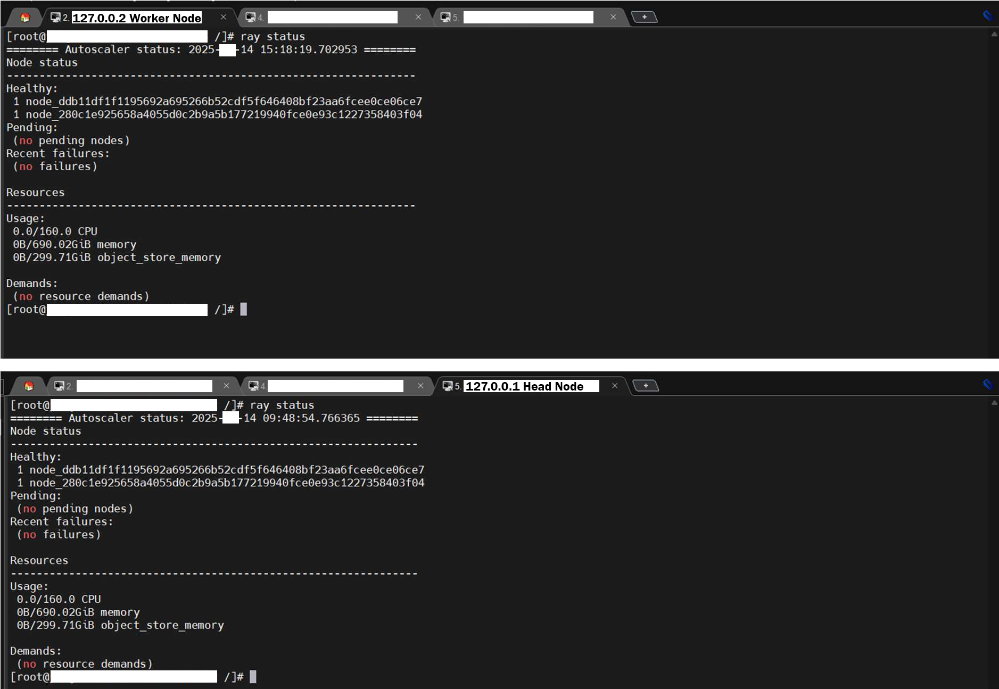

### Ray Stop Head Node
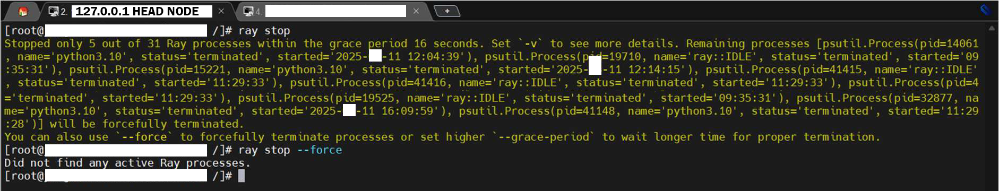

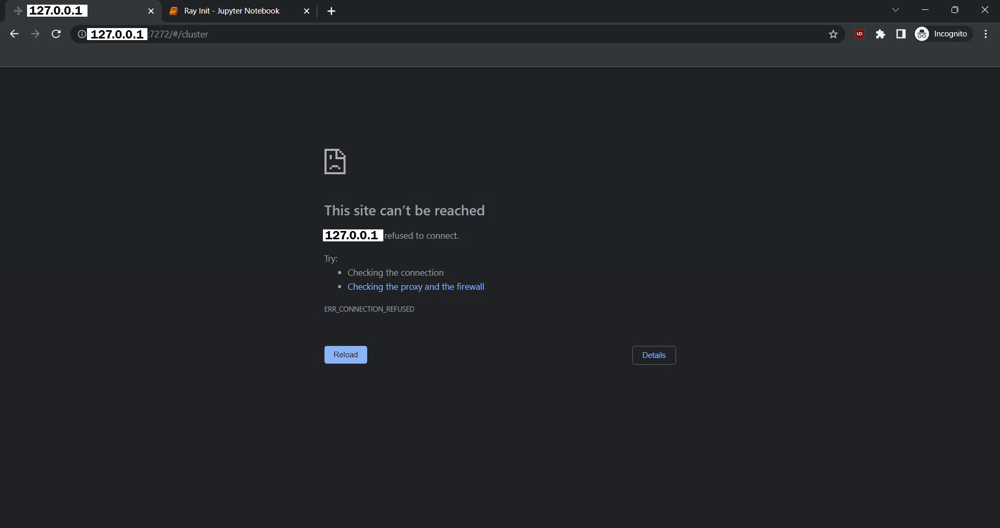

### Ray.shutdown

Wherever you call ray.init(), after the ray is no longer required, call ray.shutdown() to free the resources.


In [17]:
ray.shutdown()

### Section 3

Topics Covered:
1. @ray.remote with resources
2. instance.remote with options and resources - distribute ray jobs to specified ray node.

Self-study to know more about Ray: https://docs.ray.io/en/latest/ray-core/key-concepts.html

Other Recommended Concepts to learn about:
1. ray wait vs ray get
2. ray put and ray object

Although already covered, mastering these concepts will help with deeper understanding of ray.

# @ray.remote with resources

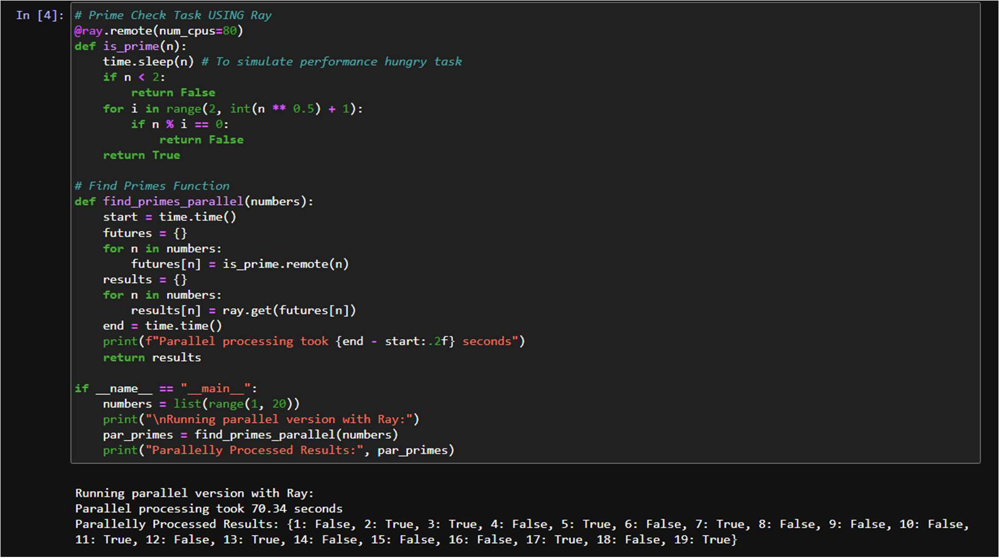

This is the same Task Code we wrote to learn Ray Tasks previously. Notice how I have added resource to the task decorator, and notice how the time taken has changed to 70 seconds (previously, 20 seconds).

When running parallelly, the time taken was 20 seconds, when running sequentially, the time taken was 190 seconds. But now that we have provided num_cpus=80, the time taken is somewhere in between minimum and maximum, i.e., 70 seconds. This is because we have specified the number of cpus each process/task will acquire, whether or not it will use it, the task job will keep 80 CPUs acquired. This will limit the number of active processes at any given time.

Previously, all 19 tasks created from number range 1-19 were running all at once. But now, 3 tasks are running at a time, as can be observed from the Jobs Tab -> Running.
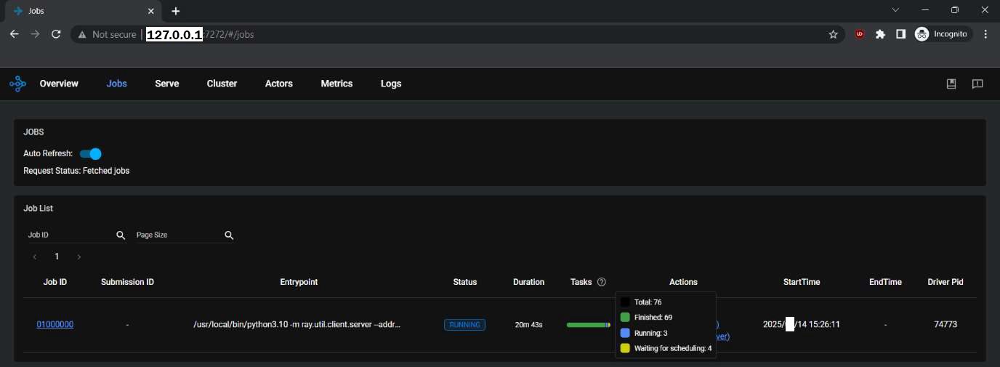

In case of Actor, this could also be viewed under Actors Tab and only 3 actor instances should be running at a time, other actor instances in Pending_creation state.

Increase and Decrease num_cpus value, and you will observe either 1 task/actor running at a time, or even 4-5 tasks/actors running at a time. This is because, the servers used to create our Ray Cluster each had 80 CPUs respectively. So, the Ray Cluster has 80*3 CPUs, and when num_cpus=80 is given,
each task/actor process will acquire 80 CPUs, so, at any given time, there is only enough resource for 3 ray jobs to run.

When giving num_cpus, num_gpus, take extra measure in ensuring you have correctly calculated the resource that a job will require. Try not to give more resource than actually required, as this may hamper other running processes, within and outside of ray. For this small process like Prime Number
Checker, even giving num_cpus=1 is more than enough, or even better, do not provide anything and let ray decide the resource it requires by itself.

Other frequently used parameters in @ray.remote() are:
1. num_gpus
2. max_calls
3. num_returns
4. max_retries

Visit to learn more: https://docs.ray.io/en/latest/ray-core/api/doc/ray.remote.html

# instance.remote with options

### instance.remote with options - resources

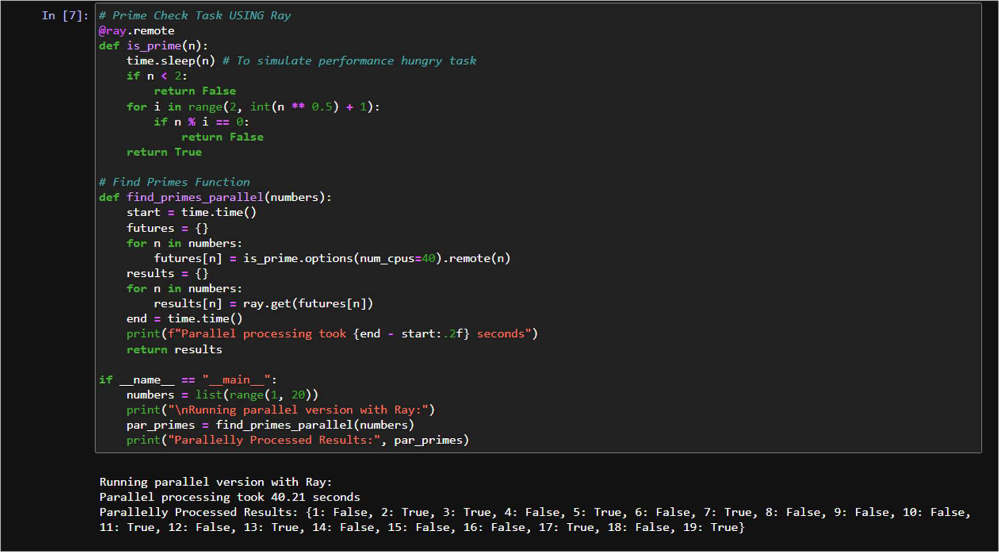

Observe, instead of giving num_cpus in @ray.remote decorator, I am now giving num_cpus to .remote() caller in the manner .options(num_cpus=40).remote().

This manner of passing num_cpus argument is resulting in similar behavior. The total time taken is now 40 seconds, as this time, there are enough resources for 6 jobs to run at a time.

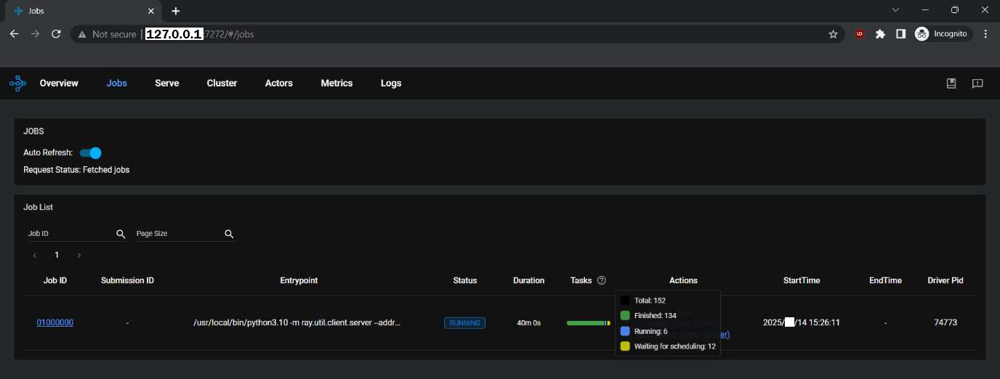

Self-Exploration: Do the same for Actor and observe the behaviors. In addition to Jobs Tab, also observe the running state and pending state under Actors Tab.

### instance.remote with options - Node Distribution

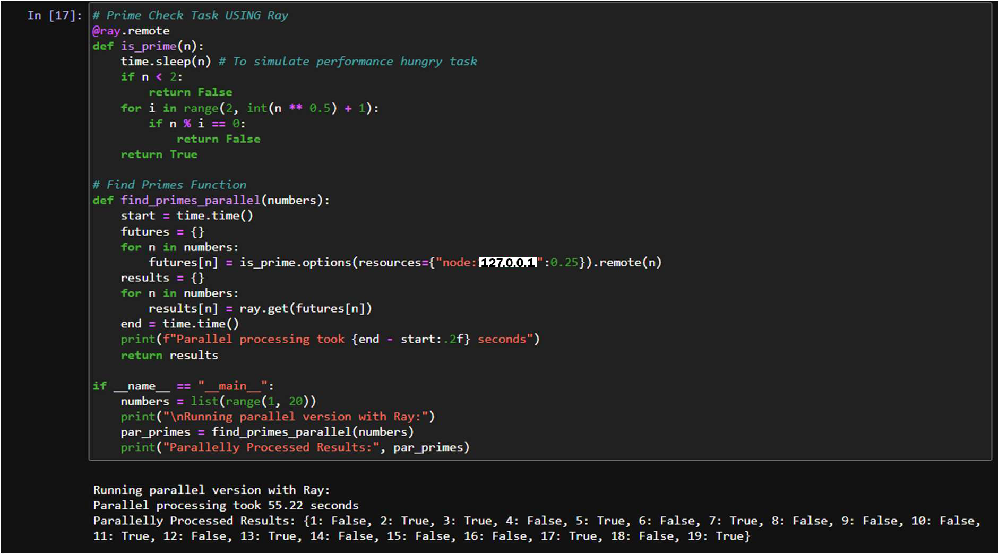

In this case, all the jobs were utilizing the resources available on Worker Node 127.0.0.1 only, as they were forced to do so. 127.0.0.1 Worker Node has 80 CPUs, and we are giving 0.25, i.e. 25% of the total resource, i.e. 20 CPUs per Job. So, at any given time, only 4 jobs were running, as can be observed
below.

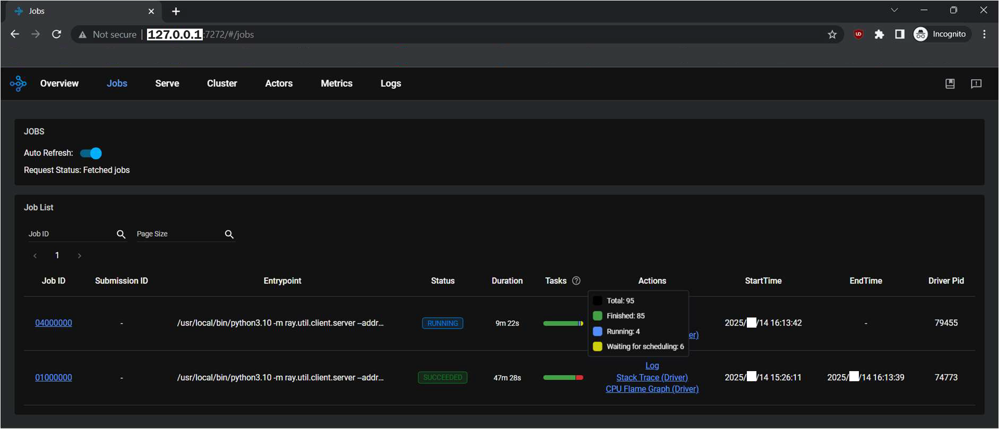

If you distribute in the similar fashion in case of Actors, under the Actors Tab, you can observe that all the Alive State Actors are running on IP 127.0.0.1 only. Do the same for Actors, and mark your observations.

Combine the concepts learned, try combining all the concepts, example, try giving num_cpus to remote decorator, as well as to ray options caller as well as use options resources and see what happens.

For the concept of Batching, go through the code in mlTasks/ml_tasks.py. Batching utilises ray.wait. Batching can be achieved through a simple ray.get as well, but ray.wait is more optimal, as you can keep sending a new job thread as soon as a running job is completed and a space is available in the queue. In case of ray.get, batches of queue is sent, and only after all the jobs in that particular batch is completed, you can send in another batch. But, with ray.wait, it's as soon as one job in the first queue gets completed, the first job of the second queue begins processing, cutting the wait time. Read the difference between ray.wait and ray.get to grasp this concept more thoroughly.